In [270]:
import warnings
warnings.filterwarnings("ignore")

# Manipulación y EDA
import numpy as np
import pandas as pd

# Transformaciones composicionales
from skbio.stats.composition import clr, clr_inv, closure

# Modelado multisalida
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor

# Evaluación del modelo
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# División de datos
from sklearn.model_selection import train_test_split, GridSearchCV

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns

In [271]:
# set visual style and default image size

plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["figure.dpi"] = 300

## Load combined_df

In [272]:
vmm_df = pd.read_csv('data/combined_df_VMM.csv', skiprows=1)

In [273]:
catatumbo_df = pd.read_csv('data/combined_df_catatumbo.csv', skiprows=1)

In [274]:
catatumbo_df.head()

,Depth,Clay,Quartz,Carbonates,GammaRay,NeutronPorosity,Resistivity,Density,GR_Dens,Porosity,Sonic,TOC,AvgPorosity,Photoelectric,RHOMAA,UMA,PEF_Dens,Well
0,3969.75,6.249976,37.376395,56.373629,78.643553,0.010161,1170.551553,2.642048,29.766132,0.010814,58.444386,3.899055,0.010488,3.247959,2.659452,8.666917,1.229334,Cerro Gordo
1,3970.80,7.630743,45.047386,47.321871,78.480317,0.008292,1167.594647,2.645179,29.669185,0.008928,57.963118,3.874733,0.008610,3.412304,2.659468,9.100204,1.290009,Cerro Gordo
2,3971.60,3.498313,73.719427,22.782260,80.599120,0.007463,1021.735200,2.645330,30.468451,0.008837,57.924186,3.741526,0.008150,3.609310,2.658850,9.622163,1.364408,Cerro Gordo
3,3972.10,11.433496,65.508263,23.058241,78.569370,0.005483,1051.229209,2.648003,29.671184,0.007227,58.080087,3.776628,0.006355,3.875708,2.658543,10.325329,1.463635,Cerro Gordo
4,3972.50,9.537947,41.145604,49.316449,69.597500,0.004168,1083.491644,2.650692,26.256351,0.005607,58.417025,3.821687,0.004888,3.718010,2.658800,9.901250,1.402656,Cerro Gordo


In [275]:
# combine both dataframes
combined_df = pd.concat([vmm_df, catatumbo_df], ignore_index=True)

In [276]:
combined_df.head()

,Well,Depth,Clay,Quartz,Carbonates,TOC,Formation,Sonic,GammaRay,NeutronPorosity,Resistivity,Density,Photoelectric,AvgPorosity,RHOMAA,UMA,GR_Dens,PEF_Dens,Porosity
0,Coyote-1,7200.0,48.675996,49.526372,1.797632,2.672507,El Salto,80.00674,61.79465,0.24560,21.25296,2.59795,5.7005,0.200711,2.999215,18.402937,23.785927,2.194230,NaN
1,Coyote-1,7214.5,28.392838,57.018752,14.588410,3.218767,El Salto,74.89855,109.48310,0.25430,36.39704,2.46675,8.7508,0.226427,2.896073,27.757992,44.383541,3.547502,NaN
2,Coyote-1,7215.0,82.689167,16.548721,0.762112,3.976217,El Salto,75.93570,106.21910,0.25615,42.38375,2.47125,8.9295,0.227161,2.903694,28.406222,42.981932,3.613354,NaN
3,Coyote-1,7232.0,82.195781,17.577069,0.227150,8.061749,El Salto,76.33705,115.05360,0.28790,184.61350,2.37395,7.7611,0.265648,2.870970,24.908553,48.465048,3.269277,NaN
4,Coyote-1,7240.0,39.656924,43.132829,17.210247,4.956246,El Salto,77.64470,117.64320,0.18490,51.75293,2.35775,7.9863,0.191456,2.679253,23.170002,49.896384,3.387255,NaN


In [277]:
combined_df.columns

Index(['Well', 'Depth', 'Clay', 'Quartz', 'Carbonates', 'TOC', 'Formation',
       'Sonic', 'GammaRay', 'NeutronPorosity', 'Resistivity', 'Density',
       'Photoelectric', 'AvgPorosity', 'RHOMAA', 'UMA', 'GR_Dens', 'PEF_Dens',
       'Porosity'],
      dtype='object')

In [278]:
features = ['Sonic', 'GammaRay', 'NeutronPorosity', 'Resistivity', 'Density',
            'Photoelectric', 'AvgPorosity', 'RHOMAA', 'UMA', 'GR_Dens', 'PEF_Dens']
            
target = ['Clay', 'Quartz', 'Carbonates']

In [279]:
# only keep the features and target columns
columns_to_keep = ['Depth'] + features + target
combined_df = combined_df[columns_to_keep]

In [280]:
# fill nans with interpolation
combined_df = combined_df.interpolate(method='linear', limit_direction='both')

<Axes: >

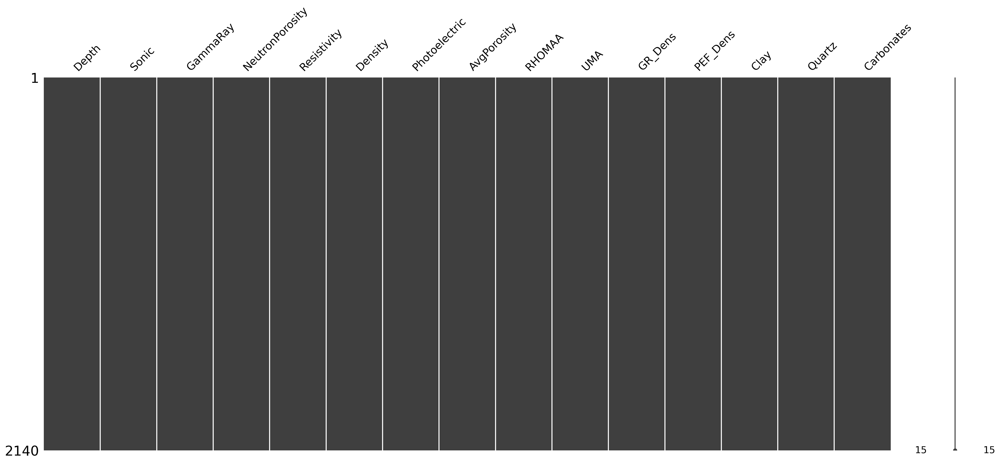

In [281]:
import missingno as msno

msno.matrix(combined_df)

In [282]:
combined_df.fillna(0, inplace=True) # fill remaining nans with 0 as the NaN values are actually zeros in the original data

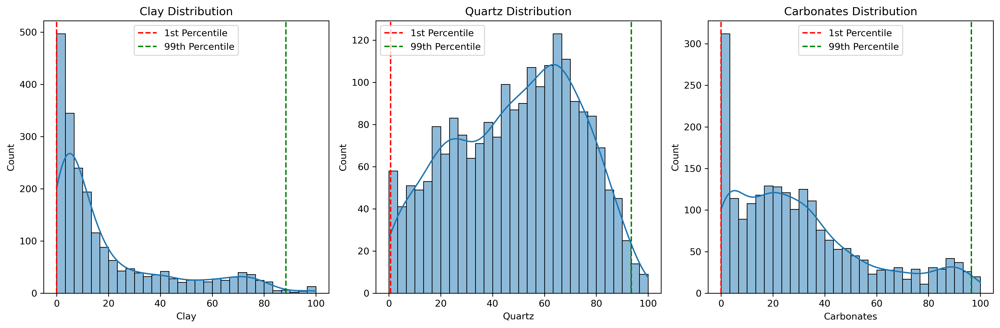

In [283]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

for i, feature in enumerate(['Clay', 'Quartz', 'Carbonates']):
    sns.histplot(combined_df[feature], bins=30, kde=True, ax=ax[i])
    ax[i].set_title(f"{feature} Distribution")
    ax[i].axvline(combined_df[feature].quantile(0.01), color='red', linestyle='--', label='1st Percentile')
    ax[i].axvline(combined_df[feature].quantile(0.99), color='green', linestyle='--', label='99th Percentile')
    ax[i].legend()

plt.tight_layout()
plt.show()

In [284]:
# Cortar primer y último percentil para cada mineral

for mineral in target:
    lower_bound = combined_df[mineral].quantile(0.01)
    upper_bound = combined_df[mineral].quantile(0.99)
    combined_df = combined_df[(combined_df[mineral] >= lower_bound) & (combined_df[mineral] <= upper_bound)]

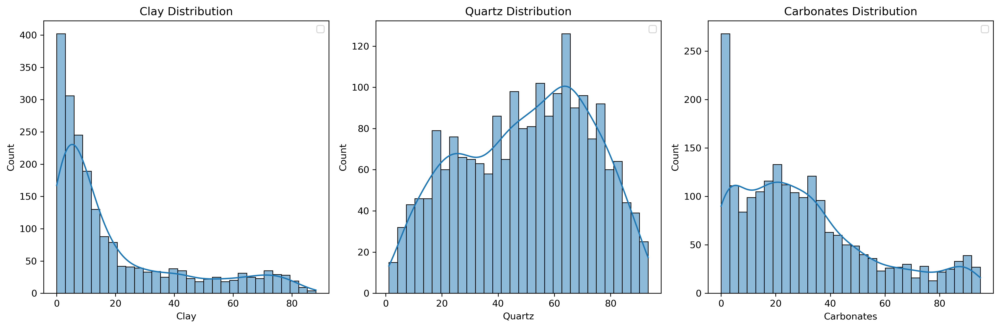

In [285]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

for i, feature in enumerate(['Clay', 'Quartz', 'Carbonates']):
    sns.histplot(combined_df[feature], bins=30, kde=True, ax=ax[i])
    ax[i].set_title(f"{feature} Distribution")
    ax[i].legend()

plt.tight_layout()
plt.show()

In [286]:
combined_df

,Depth,Sonic,GammaRay,NeutronPorosity,Resistivity,Density,Photoelectric,AvgPorosity,RHOMAA,UMA,GR_Dens,PEF_Dens,Clay,Quartz,Carbonates
0,7200.0,80.006740,61.79465,0.24560,21.252960,2.597950,5.7005,0.200711,2.999215,18.402937,23.785927,2.194230,48.675996,49.526372,1.797632
1,7214.5,74.898550,109.48310,0.25430,36.397040,2.466750,8.7508,0.226427,2.896073,27.757992,44.383541,3.547502,28.392838,57.018752,14.588410
2,7215.0,75.935700,106.21910,0.25615,42.383750,2.471250,8.9295,0.227161,2.903694,28.406222,42.981932,3.613354,82.689167,16.548721,0.762112
3,7232.0,76.337050,115.05360,0.28790,184.613500,2.373950,7.7611,0.265648,2.870970,24.908553,48.465048,3.269277,82.195781,17.577069,0.227150
4,7240.0,77.644700,117.64320,0.18490,51.752930,2.357750,7.9863,0.191456,2.679253,23.170002,49.896384,3.387255,39.656924,43.132829,17.210247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2135,1568.1,74.990562,49.68000,0.15160,38.858601,2.525527,3.7047,0.112306,2.718527,10.476766,19.671143,1.466902,10.206074,86.778742,3.015184
2136,1580.8,74.990562,49.68000,0.15160,38.858601,2.525527,3.7047,0.112306,2.718527,10.476766,19.671143,1.466902,79.227258,17.407918,3.364823
2137,1602.6,74.990562,49.68000,0.15160,38.858601,2.525527,3.7047,0.112306,2.718527,10.476766,19.671143,1.466902,2.929896,33.347539,63.722566
2138,1606.3,74.990562,49.68000,0.15160,38.858601,2.525527,3.7047,0.112306,2.718527,10.476766,19.671143,1.466902,67.828332,20.770141,11.401527


Sustitución de ceros (imputación positiva mínima) para CLR

In [287]:
from skbio.stats.composition import closure, clr

# Define un valor muy pequeño, típico en análisis composicional
eps = 1e-6

# Reemplaza ceros
Y = combined_df[target].replace(0, eps).values

# Cierre (normalizar nuevamente tras reemplazo)
Y_closed = closure(Y)

# Transformación CLR
Y_clr = clr(Y_closed)

# Features (X)
X = combined_df[features].values

In [288]:
print("X shape:", X.shape)
print("Y_clr shape:", Y_clr.shape)

X shape: (2055, 11)
Y_clr shape: (2055, 3)


## Random Forest multioutput

In [289]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
from skbio.stats.composition import clr_inv

# División de datos
X_train, X_val, y_train_clr, y_val_clr = train_test_split(
    X, Y_clr, test_size=0.2, random_state=42
)

# Modelo base
base_rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)

# MultiOutput wrapper
model = MultiOutputRegressor(base_rf)

# Entrenamiento
model.fit(X_train, y_train_clr)

# Predicción en espacio CLR
y_pred_clr = model.predict(X_val)

# Inversa CLR → compositional (proporciones en [0,1])
y_pred_compositional = closure(clr_inv(y_pred_clr))

# Escalar a porcentajes
y_pred_percent = y_pred_compositional * 100


In [290]:
print("Suma por fila (predicciones):")
print(y_pred_percent.sum(axis=1).round(2).mean())  # ≈ 100.0

Suma por fila (predicciones):
100.0


In [291]:
print("Ejemplo predicción:")
print(y_pred_percent[0])

Ejemplo predicción:
[39.06192202 41.83634599 19.10173199]


In [292]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

# --------- VALIDACIÓN ----------
# Convertir de CLR a porcentajes reales
y_val_compositional = closure(clr_inv(y_val_clr)) * 100

# Métricas validación
r2_val = r2_score(y_val_compositional, y_pred_percent, multioutput='raw_values')
mae_val = mean_absolute_error(y_val_compositional, y_pred_percent, multioutput='raw_values')
rmse_val = np.sqrt(mean_squared_error(y_val_compositional, y_pred_percent, multioutput='raw_values'))

print("📊 MÉTRICAS DE VALIDACIÓN")
for i, mineral in enumerate(target):
    print(f"{mineral} — R²: {r2_val[i]:.3f} | MAE: {mae_val[i]:.2f} | RMSE: {rmse_val[i]:.2f}")

# Predicciones en CLR
y_train_pred_clr = model.predict(X_train)

# Convertir a compositional
y_train_pred_percent = closure(clr_inv(y_train_pred_clr)) * 100
y_train_real_percent = closure(clr_inv(y_train_clr)) * 100

# Métricas entrenamiento
r2_train = r2_score(y_train_real_percent, y_train_pred_percent, multioutput='raw_values')
mae_train = mean_absolute_error(y_train_real_percent, y_train_pred_percent, multioutput='raw_values')
rmse_train = np.sqrt(mean_squared_error(y_train_real_percent, y_train_pred_percent, multioutput='raw_values'))

print("\n📊 MÉTRICAS DE ENTRENAMIENTO")
for i, mineral in enumerate(target):
    print(f"{mineral} — R²: {r2_train[i]:.3f} | MAE: {mae_train[i]:.2f} | RMSE: {rmse_train[i]:.2f}")


📊 MÉTRICAS DE VALIDACIÓN
Clay — R²: 0.441 | MAE: 10.34 | RMSE: 16.49
Quartz — R²: 0.395 | MAE: 12.44 | RMSE: 17.27
Carbonates — R²: 0.421 | MAE: 12.33 | RMSE: 19.11

📊 MÉTRICAS DE ENTRENAMIENTO
Clay — R²: 0.901 | MAE: 3.93 | RMSE: 7.14
Quartz — R²: 0.882 | MAE: 5.40 | RMSE: 7.89
Carbonates — R²: 0.900 | MAE: 4.83 | RMSE: 7.75


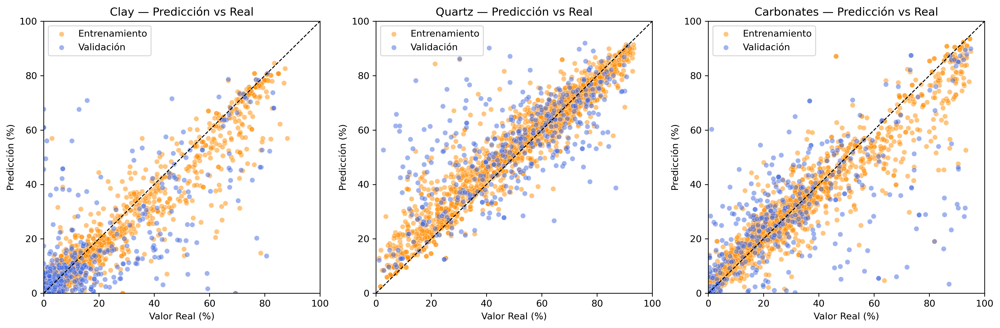

In [307]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, mineral in enumerate(target):
    # Entrenamiento (naranja)
    sns.scatterplot(
        x=y_train_real_percent[:, i],
        y=y_train_pred_percent[:, i],
        ax=axes[i],
        alpha=0.5,
        s=30,
        label='Entrenamiento',
        color='darkorange'
    )
    # Validación (azul)
    sns.scatterplot(
        x=y_val_compositional[:, i],
        y=y_pred_percent[:, i],
        ax=axes[i],
        alpha=0.5,
        s=30,
        label='Validación',
        color='royalblue'
    )

    axes[i].plot([0, 100], [0, 100], 'k--', lw=1)
    axes[i].set_title(f"{mineral} — Predicción vs Real")
    axes[i].set_xlabel("Valor Real (%)")
    axes[i].set_ylabel("Predicción (%)")
    axes[i].set_xlim(0, 100)
    axes[i].set_ylim(0, 100)
    axes[i].legend()

plt.tight_layout()
plt.show()

### Hyperparameters Tuning

In [294]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
import pandas as pd

# Modelo base
base_model = RandomForestRegressor(random_state=42)

# MultiOutput wrapper
multi_model = MultiOutputRegressor(base_model)

# Grid de hiperparámetros (ajustado: sin 'auto' para evitar bug)
param_grid = {
    'estimator__n_estimators': [100, 200, 300],
    'estimator__max_depth': [10, 20, 30, None],
    'estimator__min_samples_leaf': [1, 2, 4],
    'estimator__max_features': ['sqrt'],  # 'auto' eliminado
}

# GridSearch con validación cruzada
grid_search = GridSearchCV(
    estimator=multi_model,
    param_grid=param_grid,
    scoring='r2',
    cv=5,
    verbose=2,
    n_jobs=-1
)

# Entrenamiento
grid_search.fit(X_train, y_train_clr)

# Mostrar los mejores parámetros de forma segura
print("🧠 Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mostrar top resultados de cross-validation
results_df = pd.DataFrame(grid_search.cv_results_)
top_results = results_df.sort_values(by="mean_test_score", ascending=False)
display(top_results[['mean_test_score', 'params']].head())

Fitting 5 folds for each of 36 candidates, totalling 180 fits
🧠 Mejores hiperparámetros encontrados:
{'estimator__max_depth': None, 'estimator__max_features': 'sqrt', 'estimator__min_samples_leaf': 1, 'estimator__n_estimators': 300}


,mean_test_score,params
29,0.483333,"{'estimator__max_depth': None, 'estimator__max..."
20,0.482616,"{'estimator__max_depth': 30, 'estimator__max_f..."
28,0.481805,"{'estimator__max_depth': None, 'estimator__max..."
11,0.481737,"{'estimator__max_depth': 20, 'estimator__max_f..."
19,0.480700,"{'estimator__max_depth': 30, 'estimator__max_f..."


In [295]:
best_params = grid_search.best_params_

### Scores

In [296]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor

# Reentrenar modelo con mejores parámetros
final_model = MultiOutputRegressor(
    RandomForestRegressor(
        n_estimators=best_params['estimator__n_estimators'],
        max_depth=best_params['estimator__max_depth'],
        min_samples_leaf=best_params['estimator__min_samples_leaf'],
        max_features=best_params['estimator__max_features'],
        random_state=42
    )
)

final_model.fit(X_train, y_train_clr)

# Predecir en conjunto de validación
y_pred_clr = final_model.predict(X_val)

# Invertir transformaciones CLR → compositional → porcentaje
from skbio.stats.composition import clr_inv, closure

y_pred_percent = closure(clr_inv(y_pred_clr)) * 100
y_val_compositional = closure(clr_inv(y_val_clr)) * 100  # Ground truth en %

# Predicciones en Train
y_train_pred_clr = final_model.predict(X_train)

# Invertir CLR → compositional → porcentaje
y_train_pred_compositional = closure(clr_inv(y_train_pred_clr)) * 100
y_train_compositional = closure(clr_inv(y_train_clr)) * 100

# Validación ya está procesado (y_pred_percent, y_val_compositional)

# Métricas
print("📊 Métricas en conjunto de ENTRENAMIENTO:")
r2_train = r2_score(y_train_compositional, y_train_pred_compositional, multioutput='raw_values')
mae_train = mean_absolute_error(y_train_compositional, y_train_pred_compositional, multioutput='raw_values')
rmse_train = np.sqrt(mean_squared_error(y_train_compositional, y_train_pred_compositional, multioutput='raw_values'))

for i, mineral in enumerate(target):
    print(f"{mineral} — R²: {r2_train[i]:.3f} | MAE: {mae_train[i]:.2f} | RMSE: {rmse_train[i]:.2f}")

print("\n📊 Métricas en conjunto de VALIDACIÓN:")
r2_val = r2_score(y_val_compositional, y_pred_percent, multioutput='raw_values')
mae_val = mean_absolute_error(y_val_compositional, y_pred_percent, multioutput='raw_values')
rmse_val = np.sqrt(mean_squared_error(y_val_compositional, y_pred_percent, multioutput='raw_values'))

for i, mineral in enumerate(target):
    print(f"{mineral} — R²: {r2_val[i]:.3f} | MAE: {mae_val[i]:.2f} | RMSE: {rmse_val[i]:.2f}")

📊 Métricas en conjunto de ENTRENAMIENTO:
Clay — R²: 0.907 | MAE: 3.80 | RMSE: 6.92
Quartz — R²: 0.888 | MAE: 5.30 | RMSE: 7.66
Carbonates — R²: 0.909 | MAE: 4.71 | RMSE: 7.40

📊 Métricas en conjunto de VALIDACIÓN:
Clay — R²: 0.451 | MAE: 10.23 | RMSE: 16.33
Quartz — R²: 0.436 | MAE: 11.93 | RMSE: 16.68
Carbonates — R²: 0.461 | MAE: 11.92 | RMSE: 18.45


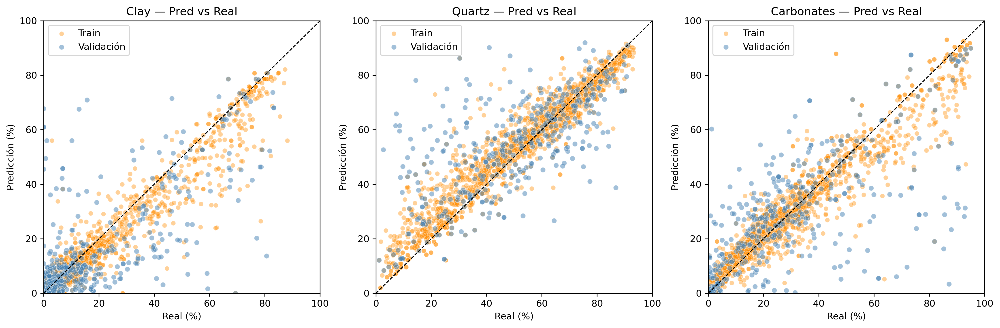

In [303]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, mineral in enumerate(target):
    # Train
    sns.scatterplot(
        x=y_train_compositional[:, i],
        y=y_train_pred_compositional[:, i],
        ax=axes[i],
        alpha=0.4,
        s=25,
        color='darkorange',
        label='Train'
    )
    # Val
    sns.scatterplot(
        x=y_val_compositional[:, i],
        y=y_pred_percent[:, i],
        ax=axes[i],
        alpha=0.5,
        s=30,
        color='steelblue',
        label='Validación'
    )

    axes[i].plot([0, 100], [0, 100], 'k--', lw=1)
    axes[i].set_title(f"{mineral} — Pred vs Real")
    axes[i].set_xlabel("Real (%)")
    axes[i].set_ylabel("Predicción (%)")
    axes[i].set_xlim(0, 100)
    axes[i].set_ylim(0, 100)
    axes[i].legend()

plt.tight_layout()
plt.show()

In [298]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer

# Función para aplicar inverse CLR + closure y calcular R² promedio
def r2_compositional(y_true_clr, y_pred_clr):
    y_true = closure(clr_inv(y_true_clr)) * 100
    y_pred = closure(clr_inv(y_pred_clr)) * 100
    r2 = r2_score(y_true, y_pred, multioutput='raw_values')
    return np.mean(r2)

# Scorer compatible con sklearn
custom_scorer = make_scorer(r2_compositional, greater_is_better=True)

In [299]:
from sklearn.model_selection import KFold

# KFold robusto
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Modelo con mejores hiperparámetros
rf_clr_model = MultiOutputRegressor(
    RandomForestRegressor(
        n_estimators=best_params['estimator__n_estimators'],
        max_depth=best_params['estimator__max_depth'],
        min_samples_leaf=best_params['estimator__min_samples_leaf'],
        max_features=best_params['estimator__max_features'],
        random_state=42
    )
)

# Calcular CV
scores = cross_val_score(rf_clr_model, X, Y_clr, cv=cv, scoring=custom_scorer)

# Mostrar resultados
print("🔁 R² promedio por fold:")
for i, score in enumerate(scores):
    print(f"Fold {i+1}: {score:.3f}")

print(f"\n🔎 Media R² CV: {scores.mean():.3f} ± {scores.std():.3f}")

🔁 R² promedio por fold:
Fold 1: 0.446
Fold 2: 0.481
Fold 3: 0.396
Fold 4: 0.371
Fold 5: 0.438

🔎 Media R² CV: 0.426 ± 0.039


In [305]:
from sklearn.model_selection import KFold
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from skbio.stats.composition import clr_inv, closure
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def evaluate_cv_rf(X, Y_clr, target_names, best_params, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    fold = 1
    all_metrics = []

    for train_idx, test_idx in kf.split(X):
        print(f"\n{'-'*10} FOLD {fold} {'-'*10}")

        X_train, X_test = X[train_idx], X[test_idx]
        y_train_clr, y_test_clr = Y_clr[train_idx], Y_clr[test_idx]

        # Modelo con mejores hiperparámetros
        model = MultiOutputRegressor(
            RandomForestRegressor(
                n_estimators=best_params['estimator__n_estimators'],
                max_depth=best_params['estimator__max_depth'],
                min_samples_leaf=best_params['estimator__min_samples_leaf'],
                max_features=best_params['estimator__max_features'],
                random_state=42
            )
        )

        # Entrenamiento
        model.fit(X_train, y_train_clr)

        # Predicción
        y_train_pred_clr = model.predict(X_train)
        y_test_pred_clr = model.predict(X_test)

        # Inversión CLR y cierre → porcentajes
        y_train_real = closure(clr_inv(y_train_clr)) * 100
        y_train_pred_real = closure(clr_inv(y_train_pred_clr)) * 100
        y_test_real = closure(clr_inv(y_test_clr)) * 100
        y_test_pred_real = closure(clr_inv(y_test_pred_clr)) * 100

        # 🔍 GRÁFICOS: 3 scatter (uno por mineral, Train en rojo, Test en azul)
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        for i, mineral in enumerate(target_names):
            sns.scatterplot(
                x=y_train_real[:, i],
                y=y_train_pred_real[:, i],
                ax=axes[i],
                color='red',
                alpha=0.5,
                s=20,
                label='Train'
            )
            sns.scatterplot(
                x=y_test_real[:, i],
                y=y_test_pred_real[:, i],
                ax=axes[i],
                color='blue',
                alpha=0.5,
                s=20,
                label='Test'
            )
            axes[i].plot([0, 100], [0, 100], 'k--', lw=1)
            axes[i].set_xlim(0, 100)
            axes[i].set_ylim(0, 100)
            axes[i].set_xlabel('Real (%)')
            axes[i].set_ylabel('Predicción (%)')
            axes[i].set_title(f'{mineral} — Pred vs Real')
            axes[i].legend()

        plt.tight_layout()
        plt.show()

        # 📊 MÉTRICAS
        metrics_fold = []
        for i, mineral in enumerate(target_names):
            r2_tr = r2_score(y_train_real[:, i], y_train_pred_real[:, i])
            mae_tr = mean_absolute_error(y_train_real[:, i], y_train_pred_real[:, i])
            rmse_tr = np.sqrt(mean_squared_error(y_train_real[:, i], y_train_pred_real[:, i]))

            r2_te = r2_score(y_test_real[:, i], y_test_pred_real[:, i])
            mae_te = mean_absolute_error(y_test_real[:, i], y_test_pred_real[:, i])
            rmse_te = np.sqrt(mean_squared_error(y_test_real[:, i], y_test_pred_real[:, i]))

            metrics_fold.append({
                "Mineral": mineral,
                "R² Train": round(r2_tr, 3),
                "MAE Train": round(mae_tr, 2),
                "RMSE Train": round(rmse_tr, 2),
                "R² Test": round(r2_te, 3),
                "MAE Test": round(mae_te, 2),
                "RMSE Test": round(rmse_te, 2)
            })

        df_metrics = pd.DataFrame(metrics_fold)
        display(df_metrics)
        all_metrics.append(df_metrics)

        fold += 1

    return all_metrics


In [301]:
target = ['Clay', 'Quartz', 'Carbonates']
best_params = grid_search.best_params_


---------- FOLD 1 ----------


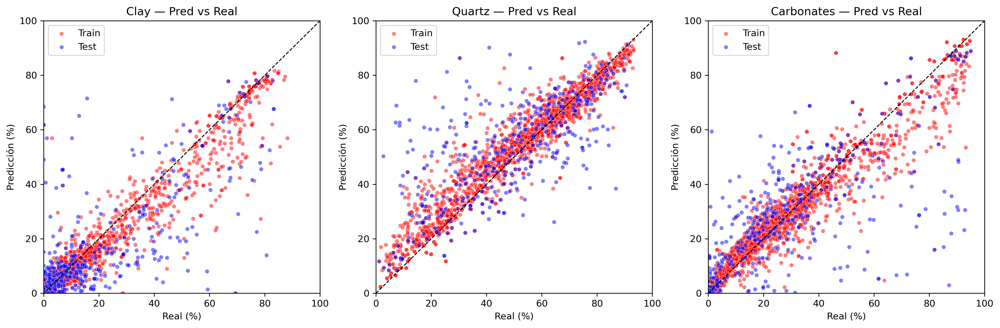

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.906,3.79,6.95,0.465,10.09,16.13
1,Quartz,0.888,5.33,7.69,0.424,12.01,16.86
2,Carbonates,0.909,4.72,7.39,0.450,12.01,18.63



---------- FOLD 2 ----------


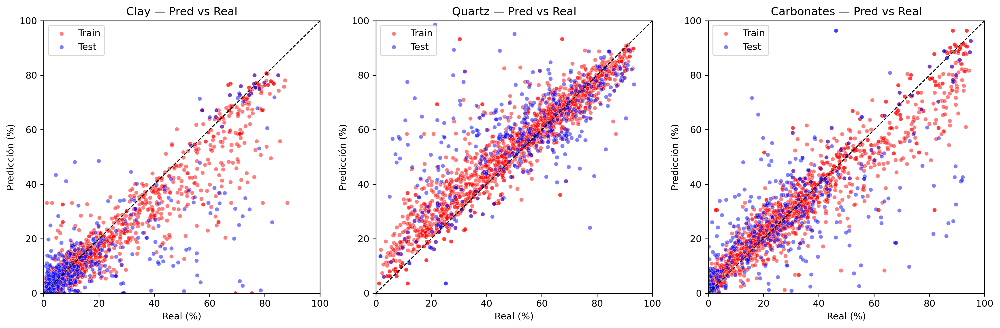

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.871,4.30,8.14,0.554,8.61,14.62
1,Quartz,0.858,5.84,8.63,0.407,12.01,17.12
2,Carbonates,0.900,5.06,7.88,0.482,11.29,16.90



---------- FOLD 3 ----------


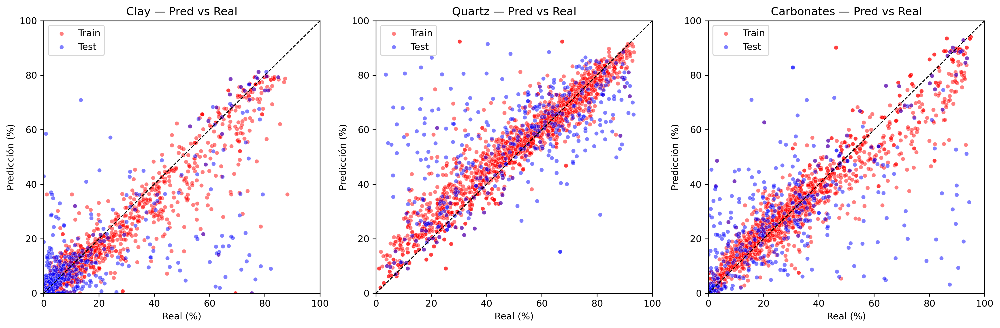

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.882,4.05,7.59,0.477,9.96,17.44
1,Quartz,0.873,5.47,8.03,0.335,13.78,19.47
2,Carbonates,0.909,4.77,7.45,0.375,12.77,19.57



---------- FOLD 4 ----------


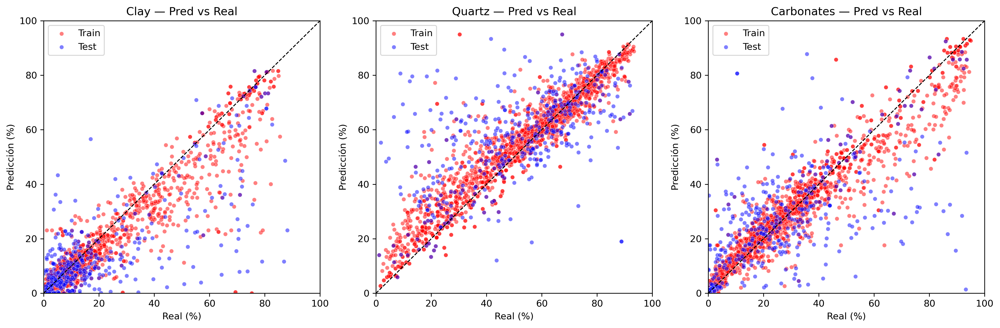

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.863,4.32,8.32,0.517,9.59,15.81
1,Quartz,0.861,5.73,8.57,0.230,13.68,19.26
2,Carbonates,0.905,4.92,7.72,0.365,12.27,18.48



---------- FOLD 5 ----------


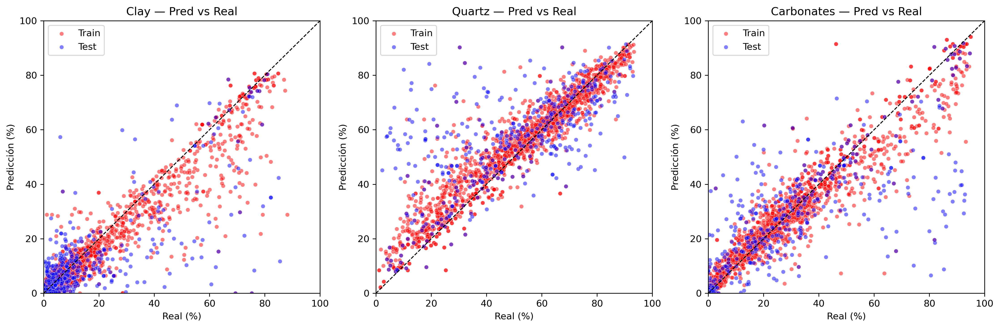

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.871,4.32,8.15,0.519,8.83,15.04
1,Quartz,0.860,5.72,8.45,0.315,13.58,19.45
2,Carbonates,0.896,4.88,7.80,0.480,12.22,19.01


In [306]:
fold_results = evaluate_cv_rf(X, Y_clr, target, best_params, n_splits=5)